# <p style="text-align: center;"> Term 3 - Machine Learning Foundation </p> </br> <p style="text-align: center;"> Term Project - Candy Data Set </p> 
Submitted By - Gaurav Virmani <br/>
Batch - March 2020 <br/>
Submission Date - 2-Oct-2020

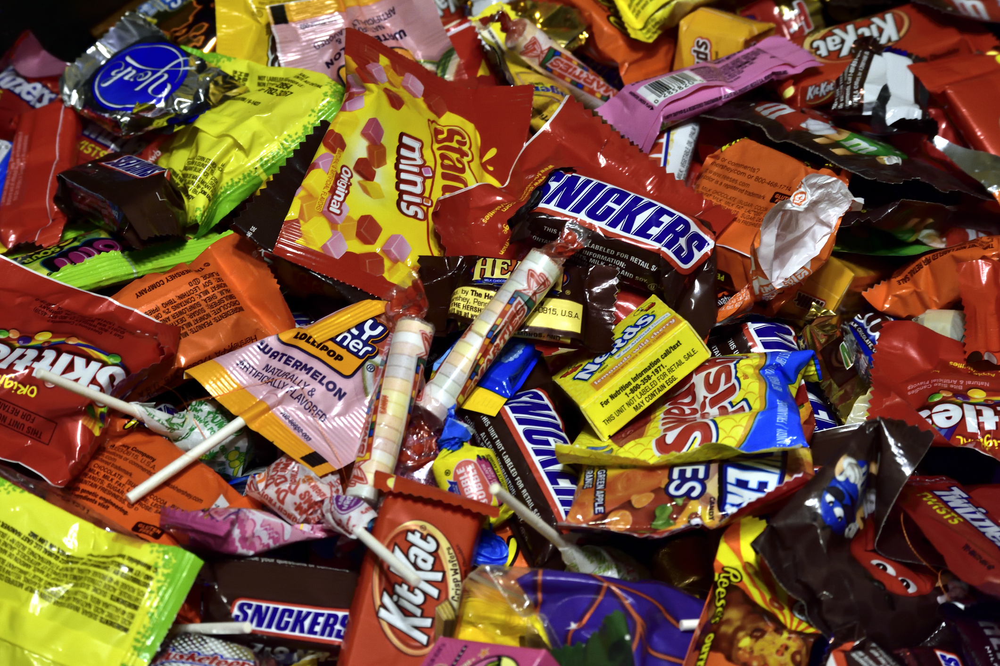

## Table of Contents

1. [Problem Statement](#section1)<br>
   - 1.1 [Introduction](#section101)<br/>
   - 1.2 [Data Source and Data Set](#section102)<br/>
   <br/>
2. [Install / Manage Additional Libraries](#section2)<br>
   <br/>
3. [Import Packages](#section3)<br>
   <br/>
4. [Load & Read Dataset](#section4)<br>
   <br/>
5. [Data Profiling (before Data Processing)](#section5)<br>
<br/>
6. [Data Processing & Data Normalization](#section6)<br>
<br/>
7. [Data Profiling (after Data Processing)](#section7)<br>
<br/>
8. [Exploratory Data Analysis (EDA)](#section8)<br>
   - 8.1 [What are the Most & Least Popular Candies?](#section801)<br/>
   - 8.2 [How Candy characterstics are correlated?](#section802)<br/>
   - 8.3 [Which are the characterstics that impact the Win percentage?](#section803)<br/>
   - 8.4 [How Candy characterstics are correlated with Sugarpercent, Pricepercent & Winpercent?](#section804)<br/>
<br/>
9. [Predictive Modeling](#section9)<br>
   - 9.1 [Data Preparation for Modeling](#section901)<br/>
   - 9.2 [Linear Regression](#section902)<br/>
   - 9.3 [Linear Regression - Model Evaluation](#section903)<br/>
   - 9.4 [Decision Tree](#section904)<br/>
   - 9.5 [Decision Tree - Model Evaluation](#section905)<br/>
   - 9.6 [Random Forest](#section906)<br/>
   - 9.7 [Random Forest - Model Evaluation](#section907)<br/>
<br/>
10. [Conclusion](#section10)<br>

<a id=section1></a>
## 1. Problem Statement
There are 3 parts to it, which we are trying to resolve:
1. What are the most and least popular candies?
2. What ingredients that make a candy better or the ingredients that could impact the rankings?
3. Build a Predictive Model to predict the ranking (winpercent) of a candy 

<a id=section101></a> 
### 1.1. Introduction
What is the best / least most popular Halloween candy? That was the question Candy dataset was collected to answer.<br/>
Data was collected where participants were shown presenting candies and asked to click on the one, they would prefer. After aggregating all the votes, each candy is given winpercent. 

Here, **Exploratory Data Analysis (EDA) and Machine Learning** concepts, along with **Python** are used on **Candy** data set to identify hidden relationships & attributes, build models using variables, draw conclusions and choose the best predictive model from the data. 
<br/>  

<a id=section102></a> 
### 1.2. Data Source and Dataset

__Source__: "https://github.com/insaid2018/Term-2/tree/master/Projects" <br/>
__Set__: "candy-data.csv"

<a id=section2></a>
## 2. Install / Manage Additional Libraries

In [1]:
!pip install plotly

In [2]:
!pip install chart-studio

In [3]:
pip install joblib

Note: you may need to restart the kernel to use updated packages.


In [4]:
!pip install -q datascience 
!pip install -q pandas-profiling

In [5]:
!pip install chart-studio

<a id=section3></a>
## 3. Import Packages

###### Pandas — Data analysis library and all data manipulation
###### Numpy — Linear algebra functions
###### Matplotlib — Visualization library for plotting and graphs
###### Seaborn — Customizable data visualization

In [6]:
# Import Python, MatPlot & Seaborn Packages
import numpy as np
import pandas as pd

# This is to ignore the warnings
import warnings
warnings.filterwarnings('ignore')                                    

import pandas_profiling

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
# This is to apply seaborn styles to the plots
sns.set(style ='darkgrid', font_scale=1.3, color_codes=True)      

# Display function for displaying the values
def display_allVal(df):                                 
    with pd.option_context("display.max_rows", 500, "display.max_columns", 500): 
        display(df)

<a id=section4></a>
## 4. Load & Read Data Set

In [7]:
# Read data file
dfCandy = pd.read_csv('https://raw.githubusercontent.com/insaid2018/Term-2/master/Projects/candy-data.csv')

In [8]:
# Get shape
dfCandy.shape

(85, 13)

In [9]:
# Get data type of each varibale / column
dfCandy.info()                                   

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85 entries, 0 to 84
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   competitorname    85 non-null     object 
 1   chocolate         85 non-null     int64  
 2   fruity            85 non-null     int64  
 3   caramel           85 non-null     int64  
 4   peanutyalmondy    85 non-null     int64  
 5   nougat            85 non-null     int64  
 6   crispedricewafer  85 non-null     int64  
 7   hard              85 non-null     int64  
 8   bar               85 non-null     int64  
 9   pluribus          85 non-null     int64  
 10  sugarpercent      85 non-null     float64
 11  pricepercent      85 non-null     float64
 12  winpercent        85 non-null     float64
dtypes: float64(3), int64(9), object(1)
memory usage: 8.8+ KB


<a id=section401></a>
### 4.1. Dataset Description

- There are a total of **85 samples (rows)** and **13 columns** in the dataset
  
- **12 columns** with a **numeric** datatype and **1 column** with an **object** datatype
  
- There are **0 missing** values in the data

**Columns Details:**

| Column Name      | Description                                                                                              |
| :-----------     | :-----------                                                 |
| competitorname   | Name of the Candy                                            |
| chocolate        | Does it contain chocolate?                                   |
| fruity           | Is it fruit flavored?                                        |
| caramel          | Does it contain caramel?                                     |
| peanutalmondy    | Does it contain peanuts, peanut butter or almonds?           |
| nougat           | Does it contain nougat?                                      |
| crispedricewafer | Does it contain crisped rice, wafers, or a cookie component? |
| hard             | Is it a hard candy?                                          |
| bar              | Is it a candy bar?                                           |
| pluribus         | Is it one of many candies in a bag or box?                   |
| sugarpercent     | The percentile of sugar it falls under within the data set   |
| pricepercent     | The unit price percentile compared to the rest of the set    |
| winpercent       | The overall win percentage according to 269,000 matchups     |

Dataset has characteristics of 85 candies, such as whether the candy has chocolate or fruit (0 - No & 1 - Yes), whether it is a hard candy or a bar etc. The target variable that we are trying to predict is the ‘winpercent’, which describes the overall win percentage according to 269,000 matchups. 

Hence, **Winpercent is the Target Variable (TV)** in this case.

In [10]:
# Get head information
dfCandy.head()   

,competitorname,chocolate,fruity,caramel,peanutyalmondy,nougat,crispedricewafer,hard,bar,pluribus,sugarpercent,pricepercent,winpercent
0,100 Grand,1,0,1,0,0,1,0,1,0,0.732,0.860,66.971725
1,3 Musketeers,1,0,0,0,1,0,0,1,0,0.604,0.511,67.602936
2,One dime,0,0,0,0,0,0,0,0,0,0.011,0.116,32.261086
3,One quarter,0,0,0,0,0,0,0,0,0,0.011,0.511,46.116505
4,Air Heads,0,1,0,0,0,0,0,0,0,0.906,0.511,52.341465


In [11]:
# Get tail information
dfCandy.tail()

,competitorname,chocolate,fruity,caramel,peanutyalmondy,nougat,crispedricewafer,hard,bar,pluribus,sugarpercent,pricepercent,winpercent
80,Twizzlers,0,1,0,0,0,0,0,0,0,0.220,0.116,45.466282
81,Warheads,0,1,0,0,0,0,1,0,0,0.093,0.116,39.011898
82,WelchÕs Fruit Snacks,0,1,0,0,0,0,0,0,1,0.313,0.313,44.375519
83,WertherÕs Original Caramel,0,0,1,0,0,0,1,0,0,0.186,0.267,41.904308
84,Whoppers,1,0,0,0,0,1,0,0,1,0.872,0.848,49.524113


In [12]:
# Get descriptive statistics of the numerical variables
dfCandy.describe(include="all")

,competitorname,chocolate,fruity,caramel,peanutyalmondy,nougat,crispedricewafer,hard,bar,pluribus,sugarpercent,pricepercent,winpercent
count,85,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000,85.000000
unique,85,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Chiclets,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,0.435294,0.447059,0.164706,0.164706,0.082353,0.082353,0.176471,0.247059,0.517647,0.478647,0.468882,50.316764
std,NaN,0.498738,0.500140,0.373116,0.373116,0.276533,0.276533,0.383482,0.433861,0.502654,0.282778,0.285740,14.714357
min,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.011000,0.011000,22.445341
25%,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.220000,0.255000,39.141056
50%,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.465000,0.465000,47.829754
75%,NaN,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.732000,0.651000,59.863998


<a id=section5></a>
## 5. Data Profiling (before Data Processing)

In [13]:
# Create Profile Report (html file) before Data Processing
profile = dfCandy.profile_report(title='Candy Profile Report before Data Processing')
profile.to_file(output_file = 'Candy Profile Report before Data Processing.html')

##### Summary: <br/>
The **Data Set** has: <br/>
Number of Variables / Columns: 13 <br/>
Number of Values / Rows: 85 <br/>
Missing Cells: 0 <br/>
Duplicate Rows: 0 <br/>
<br/>
Variable Types: <br/>
Boolean: 9 <br/>
Numerical: 3 <br/>
Categorical: 1 <br/>

<a id=section6></a>
## 6. Data Processing & Data Normalization

In [14]:
# Get missing data information in complete set
get_total = dfCandy.isnull().sum().sort_values(ascending=False)
get_percent = ((dfCandy.isnull().sum()/dfCandy.isnull().count())*100).sort_values(ascending=False)
get_missing_data = pd.concat([get_total, get_percent], axis=1, keys=['Total', 'Percent'])
print(get_missing_data)

                  Total  Percent
winpercent            0      0.0
pricepercent          0      0.0
sugarpercent          0      0.0
pluribus              0      0.0
bar                   0      0.0
hard                  0      0.0
crispedricewafer      0      0.0
nougat                0      0.0
peanutyalmondy        0      0.0
caramel               0      0.0
fruity                0      0.0
chocolate             0      0.0
competitorname        0      0.0


In [15]:
dfCandy.winpercent = round(dfCandy.winpercent,3)
dfCandy.winpercent

0     66.972
1     67.603
2     32.261
3     46.117
4     52.341
       ...  
80    45.466
81    39.012
82    44.376
83    41.904
84    49.524
Name: winpercent, Length: 85, dtype: float64

<a id=section7></a>
## 7. Data Profiling (after Data Processing)

In [16]:
# Create Profile Report (html file) after Data Processing
profileA = dfCandy.profile_report(title='Candy Profile Report after Data Processing')
profileA.to_file(output_file = 'Candy Profile Report after Data Processing.html')

##### Summary: <br/>

Dataset is clean, normalized and contains no Null values, hence, there is no change in before and after summary of Data Profiling

<a id=section8></a>
## 8. Exploratory Data Analysis (EDA)

**Exploratory Data Analysis (EDA)** is a method to analyze and visualize data using different types of plots.

#### <a id=section801></a>
### 8.1. What are the Most & Least Popular Candies?  

In [17]:
var_popular = dfCandy[['competitorname','winpercent']].sort_values(by='winpercent')
var_popular

,competitorname,winpercent
44,Nik L Nip,22.445
7,Boston Baked Beans,23.418
12,Chiclets,24.525
72,Super Bubble,27.304
26,Jawbusters,28.127
...,...,...
64,Snickers,76.674
28,Kit Kat,76.769
79,Twix,81.643
51,ReeseÕs Miniatures,81.866


Text(0.5, 1.0, 'Bar Chart - Least Popular Candies')

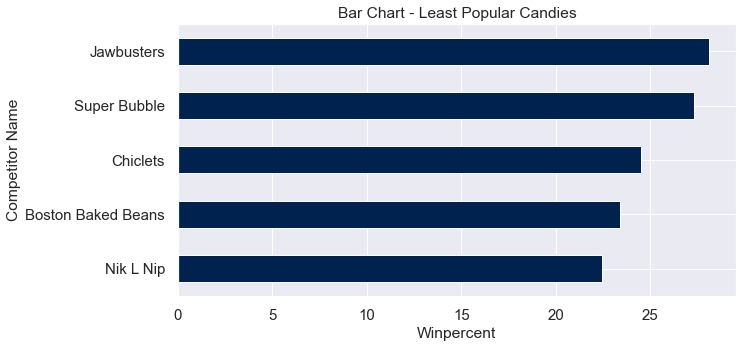

In [18]:
# Least Popular Candies
var_popular.head(5).plot(x='competitorname',y='winpercent',kind='barh',figsize = (10,5),cmap='cividis',legend=False,fontsize=15);
plt.xlabel('Winpercent')
plt.ylabel('Competitor Name')
plt.title('Bar Chart - Least Popular Candies')

Text(0.5, 1.0, 'Bar Chart - Most Popular Candies')

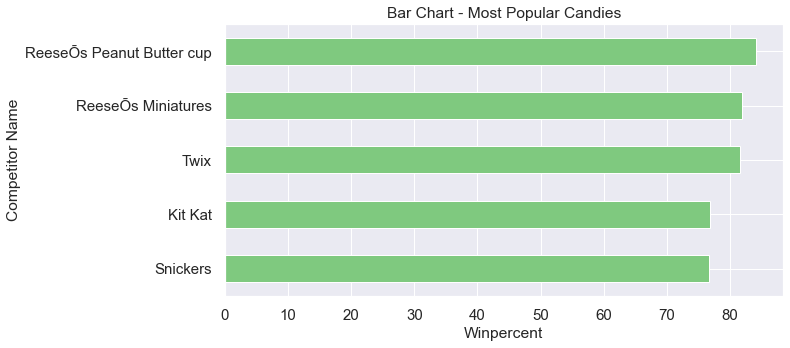

In [19]:
# Most Popular Candies
var_popular.tail(5).plot(x='competitorname',y='winpercent',kind='barh',figsize = (10,5),legend=False,cmap='Accent', fontsize=15);
plt.xlabel('Winpercent')
plt.ylabel('Competitor Name')
plt.title('Bar Chart - Most Popular Candies')

#### Obervations: 
Reese's Peanut Butter cup, Reese's Miniatures and Twix are the candies that have win more than 80% i.e. the most popular candies and least popular candies are Nik L Nip, Boston Baked Beans and Chiclets

#### <a id=section802></a>
### 8.2. How Candy characterstics are correlated?  

In [20]:
def corrank(X):
    import itertools                         # For iterator operations
    temp_df = pd.DataFrame([[i,j,X.corr().abs().loc[i,j]] for i,j in list(itertools.combinations(X.corr().abs(), 2))],
                         columns=['Feature1','Feature2','Corelation'])    
    return temp_df.sort_values(by='Corelation',ascending=False).reset_index(drop=True)

# prints a descending list of correlation pair (Max on top)
display_allVal(corrank(dfCandy))

,Feature1,Feature2,Corelation
0,chocolate,fruity,0.741721
1,chocolate,winpercent,0.636517
2,chocolate,bar,0.597421
3,bar,pluribus,0.593409
4,nougat,bar,0.522976
5,bar,pricepercent,0.518407
6,fruity,bar,0.515066
7,chocolate,pricepercent,0.504675
8,fruity,pricepercent,0.430969
9,bar,winpercent,0.429933


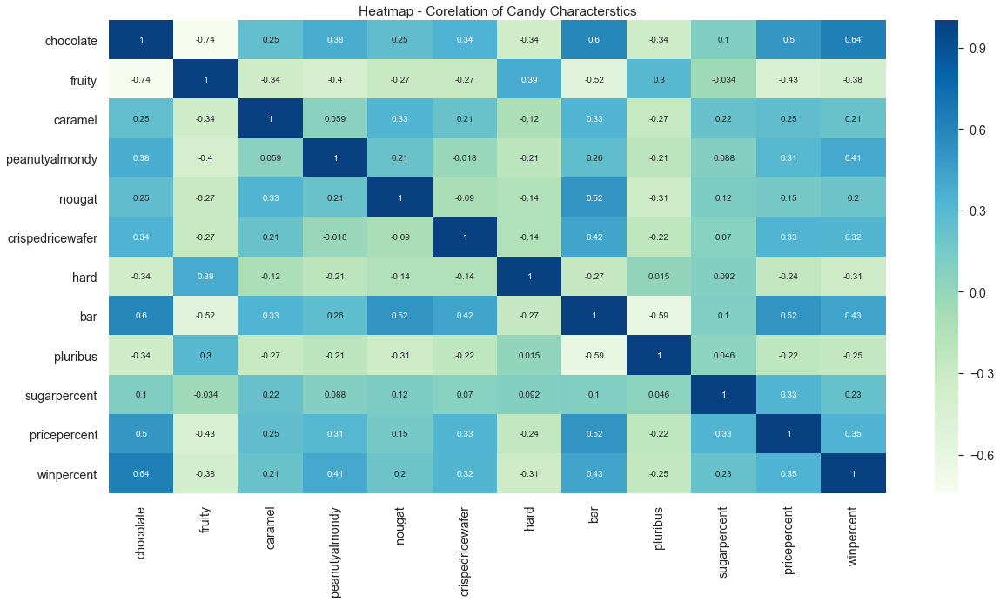

In [21]:
# Creating a correlation matrix using the corr function of the dataframe
# Using seaborn's heatmap function to plot a heatmap of the correlatin matrix

corr_mat = dfCandy.corr()
plt.figure(figsize=(20,10))
sns.heatmap(corr_mat, annot=True, cmap='GnBu')
plt.title('Heatmap - Corelation of Candy Characterstics');

#### Obervations: 
- Presence of Chocolate, followed by being a Bar and having Peanuts/Almonds in the candy give a high win percentage
- Popular candies are bit higher in Price and Sugar percentages
- Chocolate and Nougat candies usually come in the form of a Bar and are expensive
- Chocolate is not found in fruity candies
- Price of Chocolate or Bar candies are more while Fruity candies are least expensive
- Fruity candies are hard as compared to the others

In [22]:
dfCandy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85 entries, 0 to 84
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   competitorname    85 non-null     object 
 1   chocolate         85 non-null     int64  
 2   fruity            85 non-null     int64  
 3   caramel           85 non-null     int64  
 4   peanutyalmondy    85 non-null     int64  
 5   nougat            85 non-null     int64  
 6   crispedricewafer  85 non-null     int64  
 7   hard              85 non-null     int64  
 8   bar               85 non-null     int64  
 9   pluribus          85 non-null     int64  
 10  sugarpercent      85 non-null     float64
 11  pricepercent      85 non-null     float64
 12  winpercent        85 non-null     float64
dtypes: float64(3), int64(9), object(1)
memory usage: 8.8+ KB


#### <a id=section803></a>
### 8.3. Which are the characterstics that impact the Win percentage?

Text(0.5, 1.0, 'Pie Chart - Proportion of Chocolate Candies')

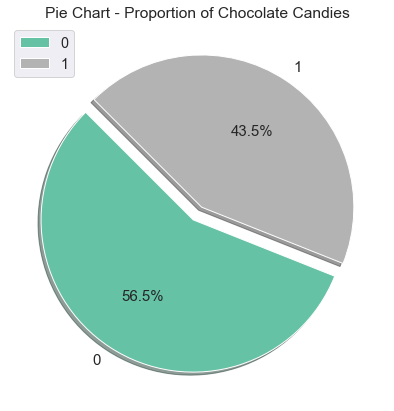

In [23]:
# Using plot function to plot the Pie chart for showing proportion

dfCandy['chocolate'].value_counts().plot(kind='pie', explode=[0.05,0.05], fontsize=15, autopct='%3.1f%%', 
                                               figsize=(7,7), shadow=True, startangle=135, legend=True, cmap='Set2')
plt.ylabel('')
plt.title('Pie Chart - Proportion of Chocolate Candies')

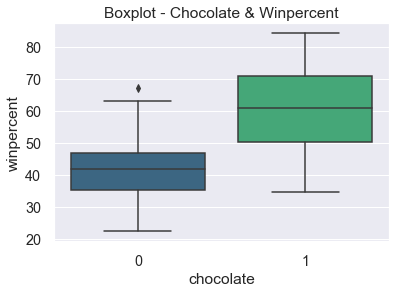

In [24]:
# Using seaborn's Boxplot to determine how the data is distributed

sns.boxplot(data=dfCandy, x='chocolate', y='winpercent', palette='viridis')
plt.title('Boxplot - Chocolate & Winpercent')
plt.xlabel('chocolate')
plt.ylabel('winpercent');

#### Obervations: 
43.5% of the candies contain Chocolate and have high win percentage

Text(0.5, 1.0, 'Pie Chart - Proportion of Fruity Candies')

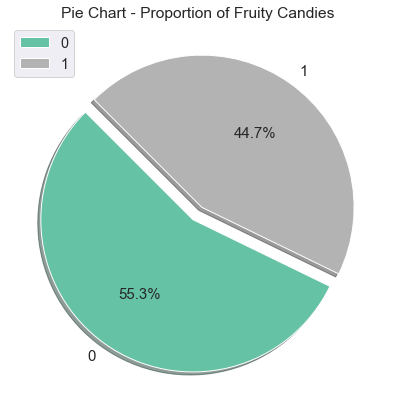

In [25]:
dfCandy['fruity'].value_counts().plot(kind='pie', explode=[0.05,0.05], fontsize=15, autopct='%3.1f%%', 
                                               figsize=(7,7), shadow=True, startangle=135, legend=True, cmap='Set2')
plt.ylabel('')
plt.title('Pie Chart - Proportion of Fruity Candies')

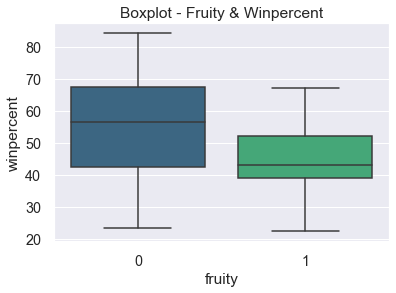

In [26]:
sns.boxplot(data=dfCandy, x='fruity', y='winpercent', palette='viridis')

plt.title('Boxplot - Fruity & Winpercent')
plt.xlabel('fruity')
plt.ylabel('winpercent');

#### Obervations: 
45% of the candies have Fruity flavor but have low win percentage

Text(0.5, 1.0, 'Pie Chart - Proportion of Caramel Candies')

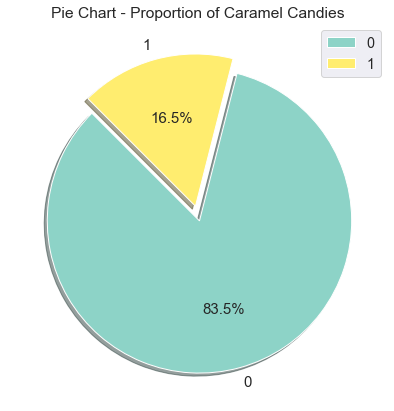

In [27]:
dfCandy['caramel'].value_counts().plot(kind='pie', explode=[0.05,0.05], fontsize=15, autopct='%3.1f%%', 
                                               figsize=(7,7), shadow=True, startangle=135, legend=True, cmap='Set3')
plt.ylabel('')
plt.title('Pie Chart - Proportion of Caramel Candies')

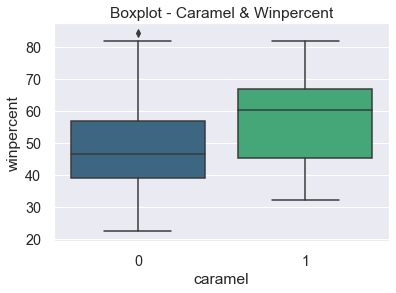

In [28]:
sns.boxplot(data=dfCandy, x='caramel', y='winpercent', palette='viridis')

plt.title('Boxplot - Caramel & Winpercent')
plt.xlabel('caramel')
plt.ylabel('winpercent');

#### Obervations: 
Only 16.5% of the candies contain Caramel but have slight higher win percentage

Text(0.5, 1.0, 'Pie Chart - Proportion of Peanut / Almond Candies')

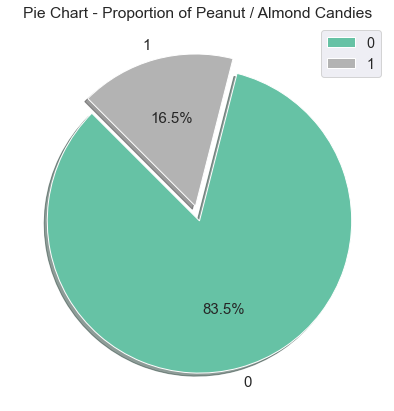

In [29]:
dfCandy['peanutyalmondy'].value_counts().plot(kind='pie', explode=[0.05,0.05], fontsize=15, autopct='%3.1f%%', 
                                               figsize=(7,7), shadow=True, startangle=135, legend=True, cmap='Set2')
plt.ylabel('')
plt.title('Pie Chart - Proportion of Peanut / Almond Candies')

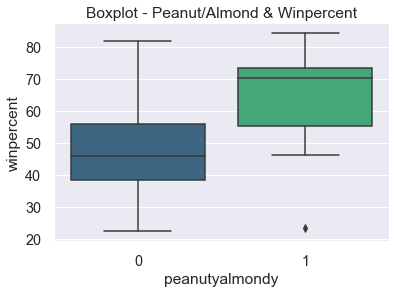

In [30]:
sns.boxplot(data=dfCandy, x='peanutyalmondy', y='winpercent', palette='viridis')

plt.title('Boxplot - Peanut/Almond & Winpercent')
plt.xlabel('peanutyalmondy')
plt.ylabel('winpercent');

#### Obervations: 
Only 16.5% of the candies contain Peanuts / Almonds and doesn't effect win percentage much

Text(0.5, 1.0, 'Pie Chart - Proportion of Nougat Candies')

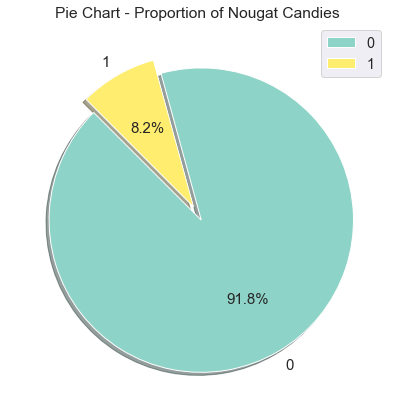

In [31]:
dfCandy['nougat'].value_counts().plot(kind='pie', explode=[0.05,0.05], fontsize=15, autopct='%3.1f%%', 
                                               figsize=(7,7), shadow=True, startangle=135, legend=True, cmap='Set3')
plt.ylabel('')
plt.title('Pie Chart - Proportion of Nougat Candies')

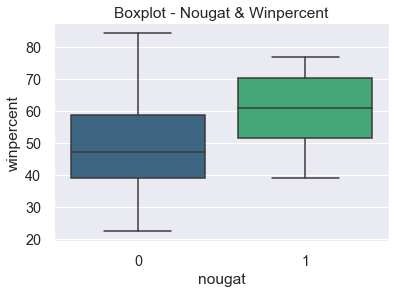

In [32]:
sns.boxplot(data=dfCandy, x='nougat', y='winpercent', palette='viridis')

plt.title('Boxplot - Nougat & Winpercent')
plt.xlabel('nougat')
plt.ylabel('winpercent');

Text(0.5, 1.0, 'Pie Chart - Proportion of Crisped Rice/Wafer Candies')

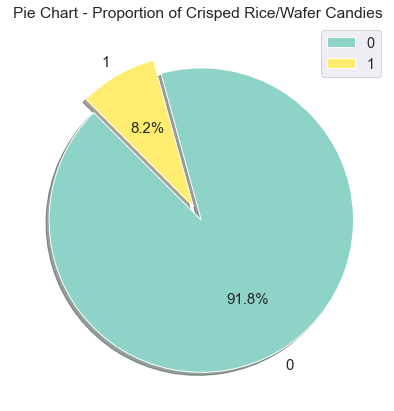

In [33]:
dfCandy['crispedricewafer'].value_counts().plot(kind='pie', explode=[0.05,0.05], fontsize=15, autopct='%3.1f%%', 
                                               figsize=(7,7), shadow=True, startangle=135, legend=True, cmap='Set3')
plt.ylabel('')
plt.title('Pie Chart - Proportion of Crisped Rice/Wafer Candies')

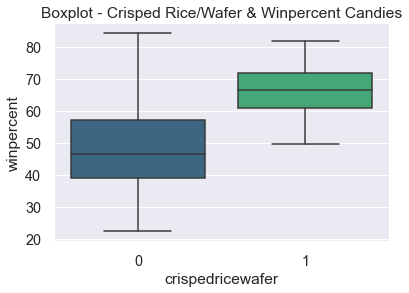

In [34]:
sns.boxplot(data=dfCandy, x='crispedricewafer', y='winpercent', palette='viridis')

plt.title('Boxplot - Crisped Rice/Wafer & Winpercent Candies')
plt.xlabel('crispedricewafer')
plt.ylabel('winpercent');

#### Obervations: 
Very less i.e. around 8% each are Nougat and Crisped Rice/Wafer candies. Also do not contribute much on the win percentage

Text(0.5, 1.0, 'Pie Chart - Proportion of Hard Candies')

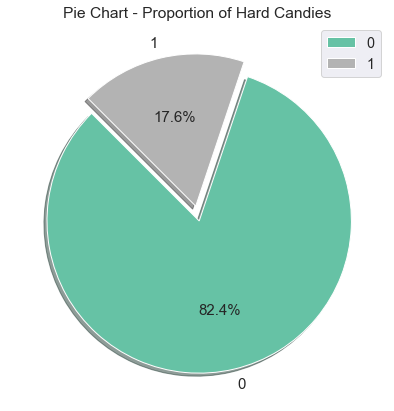

In [35]:
dfCandy['hard'].value_counts().plot(kind='pie', explode=[0.05,0.05], fontsize=15, autopct='%3.1f%%', 
                                               figsize=(7,7), shadow=True, startangle=135, legend=True, cmap='Set2')
plt.ylabel('')
plt.title('Pie Chart - Proportion of Hard Candies')

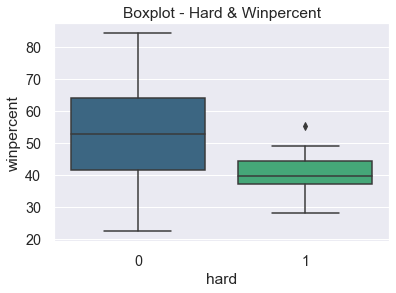

In [36]:
sns.boxplot(data=dfCandy, x='hard', y='winpercent', palette='viridis')

plt.title('Boxplot - Hard & Winpercent')
plt.xlabel('hard')
plt.ylabel('winpercent');

#### Obervations: 
Hard candies make up only 18% of the total candies and have a lower win percentage too

Text(0.5, 1.0, 'Pie Chart - Proportion of Bar Candies')

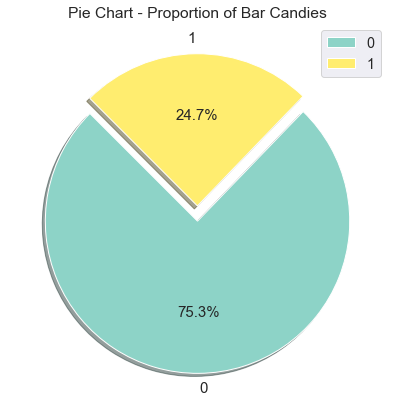

In [37]:
dfCandy['bar'].value_counts().plot(kind='pie', explode=[0.05,0.05], fontsize=15, autopct='%3.1f%%', 
                                               figsize=(7,7), shadow=True, startangle=135, legend=True, cmap='Set3')
plt.ylabel('')
plt.title('Pie Chart - Proportion of Bar Candies')

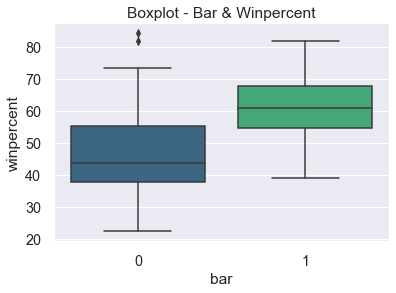

In [38]:
sns.boxplot(data=dfCandy, x='bar', y='winpercent', palette='viridis')

plt.title('Boxplot - Bar & Winpercent')
plt.xlabel('bar')
plt.ylabel('winpercent');

#### Obervations: 
Around 25% are Bar candies and contributes to high win percentage 

#### <a id=section804></a>
### 8.4. How Candy characterstics are correlated with Sugarpercent, Pricepercent & Winpercent? 

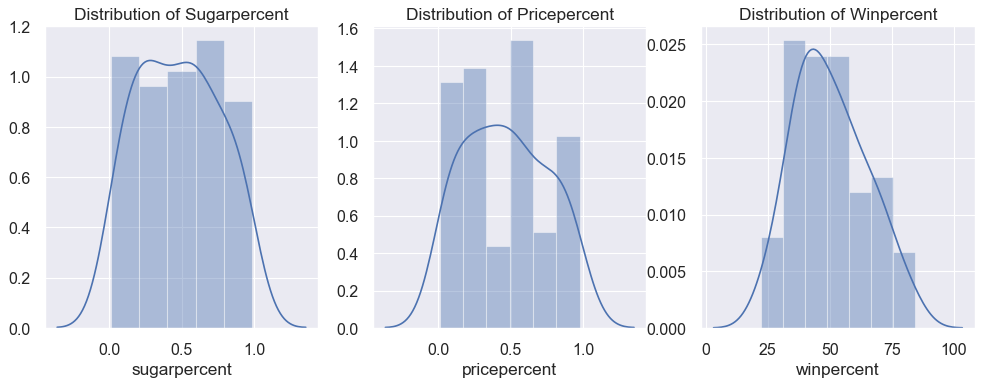

In [39]:
# Using seaborn's distplot function to plot the distribution for specific columns of the dataset

plt.figure(figsize=(15,5), dpi=80)
plt.subplot(1,3,1)
sns.distplot(dfCandy['sugarpercent'])
plt.title("Distribution of Sugarpercent")

plt.subplot(1,3,2)
sns.distplot(dfCandy['pricepercent'])
plt.title("Distribution of Pricepercent")

plt.subplot(1,3,3)
sns.distplot(dfCandy['winpercent'])
plt.title("Distribution of Winpercent")

plt.show()

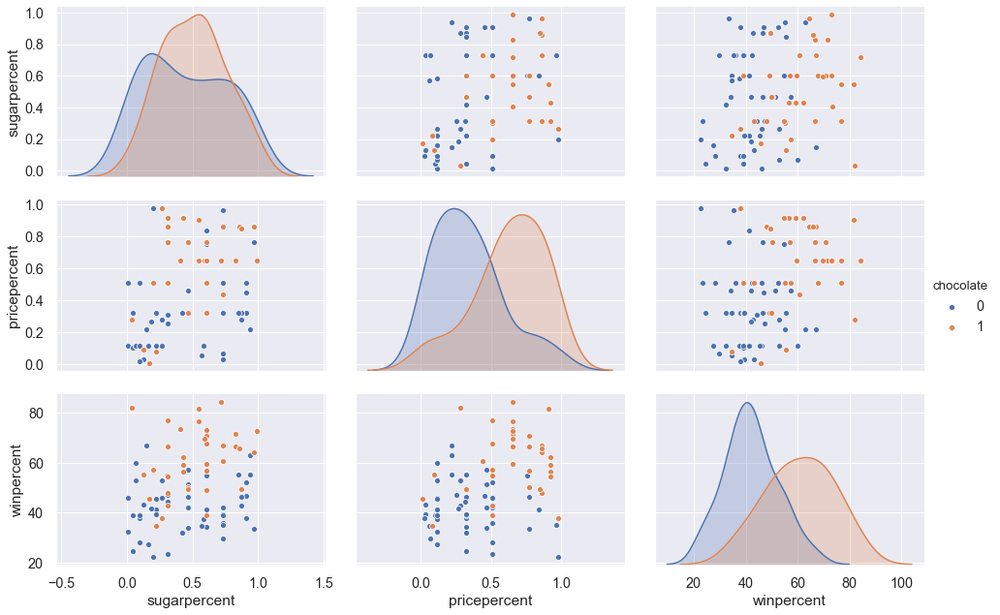

In [40]:
# Using seaborn's pairplot function to plot the pairplot for specific columns of the dataset

sns.pairplot(dfCandy[["sugarpercent","pricepercent","winpercent","chocolate"]],vars = ["sugarpercent","pricepercent","winpercent"],
             hue="chocolate",dropna=True, height = 3, aspect = 1.5)

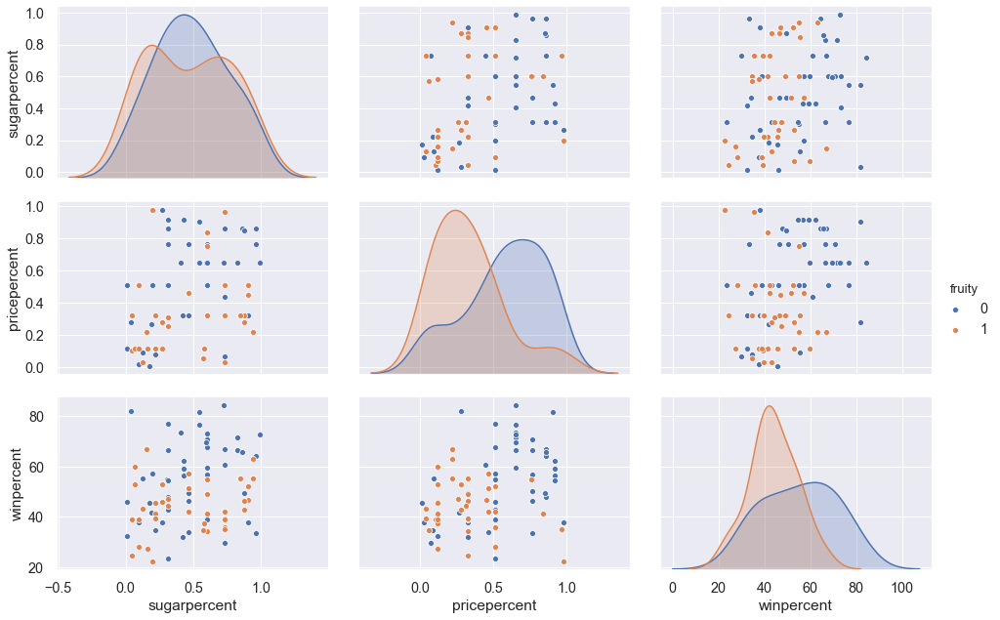

In [41]:
sns.pairplot(dfCandy[["sugarpercent","pricepercent","winpercent","fruity"]],vars = ["sugarpercent","pricepercent","winpercent"],
             hue="fruity",dropna=True, height = 3, aspect = 1.5)

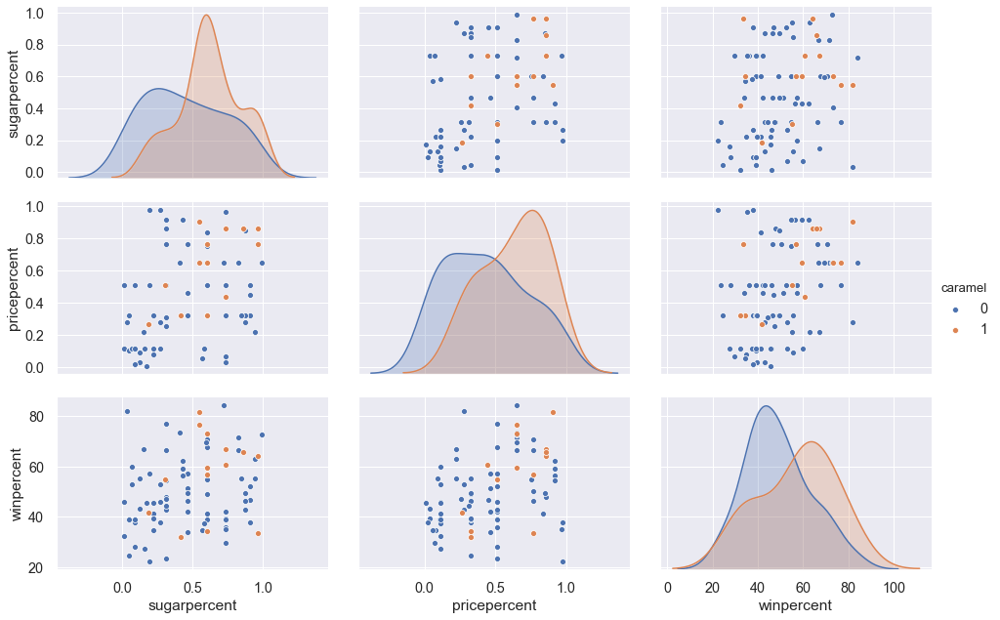

In [42]:
sns.pairplot(dfCandy[["sugarpercent","pricepercent","winpercent","caramel"]],vars = ["sugarpercent","pricepercent","winpercent"],
             hue="caramel",dropna=True, height = 3, aspect = 1.5)

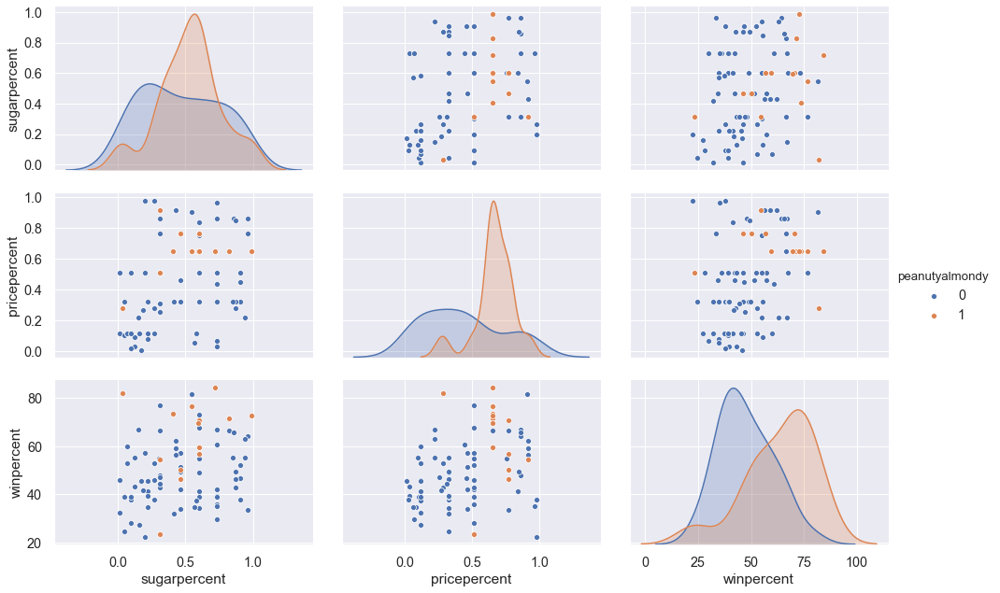

In [43]:
sns.pairplot(dfCandy[["sugarpercent","pricepercent","winpercent","peanutyalmondy"]],vars = ["sugarpercent","pricepercent","winpercent"],
             hue="peanutyalmondy",dropna=True, height = 3, aspect = 1.5)

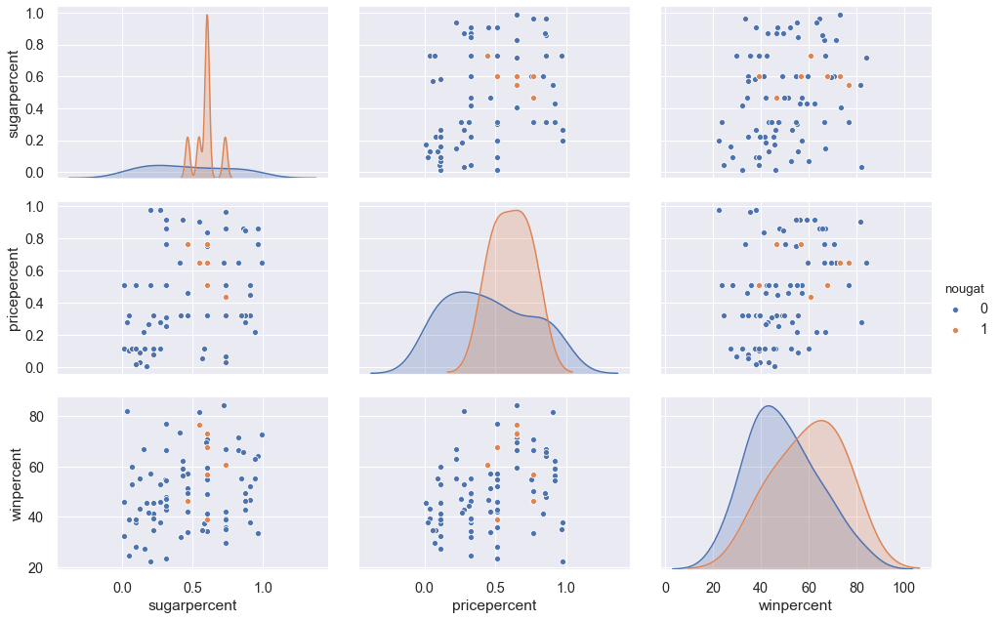

In [44]:
sns.pairplot(dfCandy[["sugarpercent","pricepercent","winpercent","nougat"]],vars = ["sugarpercent","pricepercent","winpercent"],
             hue="nougat",dropna=True, height = 3, aspect = 1.5)

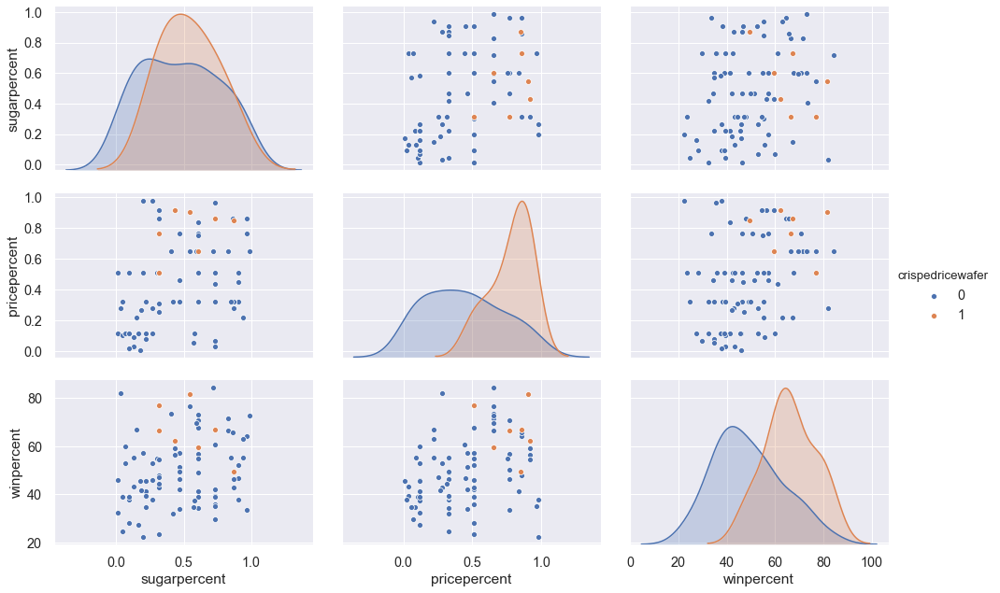

In [45]:
sns.pairplot(dfCandy[["sugarpercent","pricepercent","winpercent","crispedricewafer"]],vars = ["sugarpercent","pricepercent","winpercent"],
             hue="crispedricewafer",dropna=True, height = 3, aspect = 1.5)

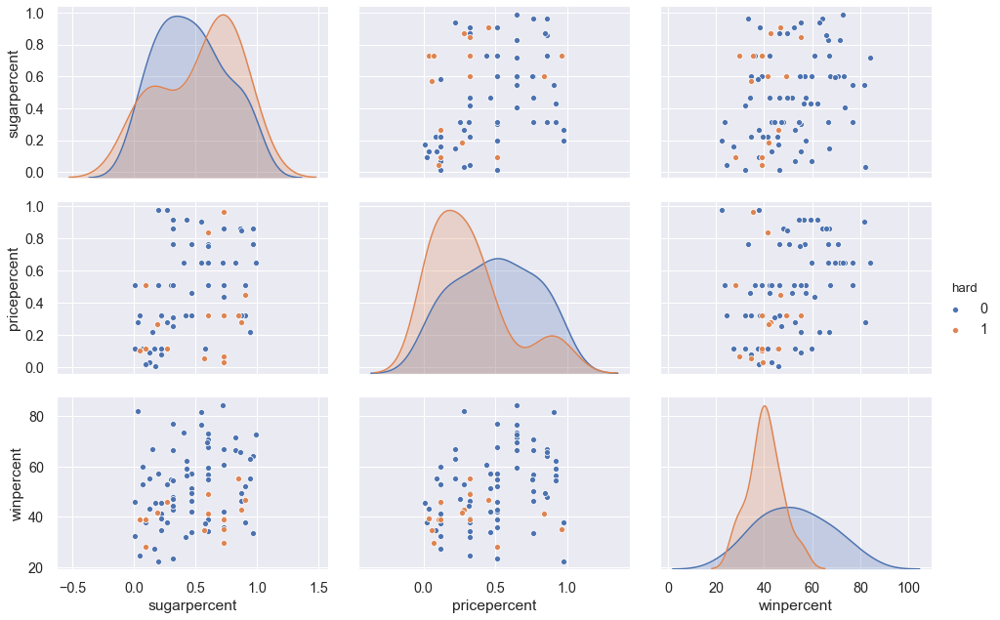

In [46]:
sns.pairplot(dfCandy[["sugarpercent","pricepercent","winpercent","hard"]],vars = ["sugarpercent","pricepercent","winpercent"],
             hue="hard",dropna=True, height = 3, aspect = 1.5)

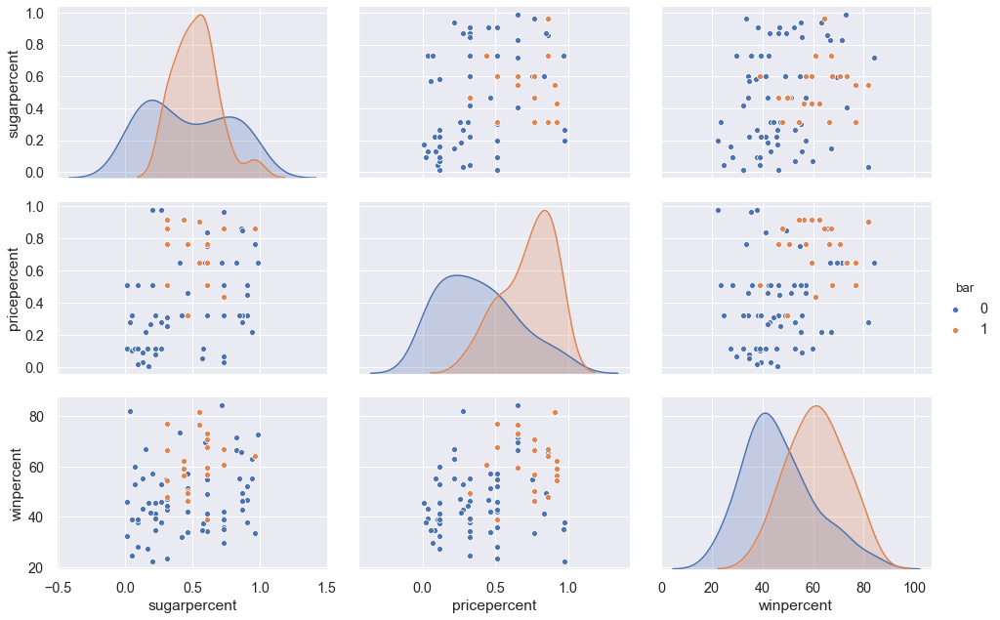

In [47]:
sns.pairplot(dfCandy[["sugarpercent","pricepercent","winpercent","bar"]],vars = ["sugarpercent","pricepercent","winpercent"],
             hue="bar",dropna=True, height = 3, aspect = 1.5)

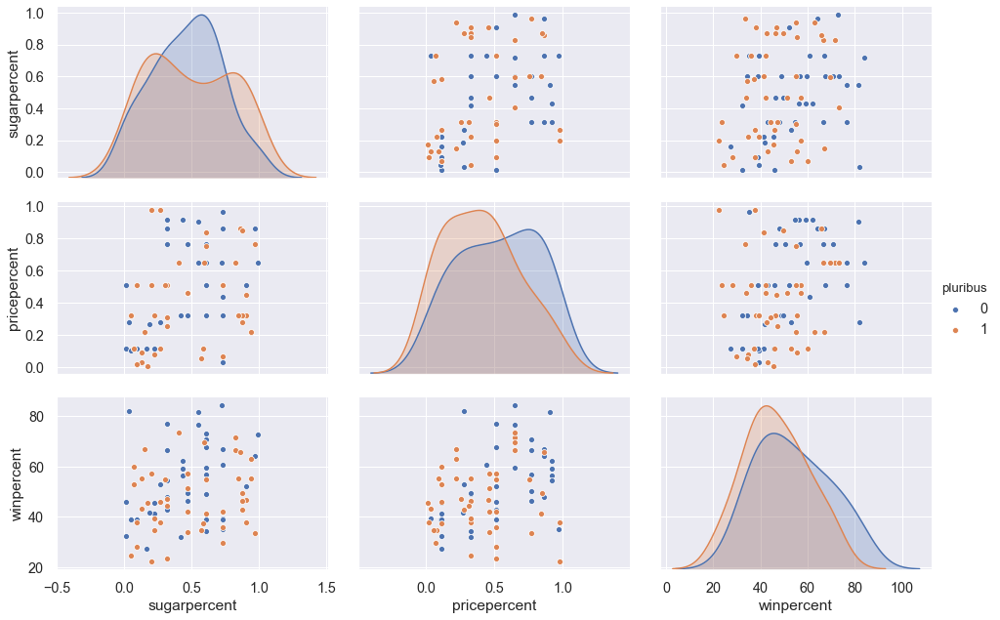

In [48]:
sns.pairplot(dfCandy[["sugarpercent","pricepercent","winpercent","pluribus"]],vars = ["sugarpercent","pricepercent","winpercent"],
             hue="pluribus",dropna=True, height = 3, aspect = 1.5)

<a id=section9></a>
## 9. Predictive Modeling

<a id=section901></a>
### 9.1. Data Preparation for Modeling 

###### Import  sklearn — Used for classification, clustering, and model selection

In [49]:
from sklearn.model_selection import train_test_split

In [50]:
dfCandy.columns

Index(['competitorname', 'chocolate', 'fruity', 'caramel', 'peanutyalmondy',
       'nougat', 'crispedricewafer', 'hard', 'bar', 'pluribus', 'sugarpercent',
       'pricepercent', 'winpercent'],
      dtype='object')

In [51]:
#Split the dataset into training and test sets. 80% of train data and 20% of test data
dfCandy_train, dfCandy_test = train_test_split(dfCandy, test_size = 0.2, random_state = 10)

In [52]:
#Drop competitorname & winpercent columns from x_train and x_test
#Create y_train and y_test for winpercent
x_train = dfCandy_train.drop(['competitorname','winpercent'], 1)
y_train = dfCandy_train['winpercent']
x_test = dfCandy_test.drop(['competitorname','winpercent'], 1)
y_test = dfCandy_test['winpercent']

In [53]:
x_train.columns

Index(['chocolate', 'fruity', 'caramel', 'peanutyalmondy', 'nougat',
       'crispedricewafer', 'hard', 'bar', 'pluribus', 'sugarpercent',
       'pricepercent'],
      dtype='object')

In [54]:
# Shapes of training and test sets
print('x_train: ', x_train.shape)
print('y_train: ', y_train.shape)
print('x_test: ', x_test.shape)
print('y_test: ', y_test.shape)

x_train:  (68, 11)
y_train:  (68,)
x_test:  (17, 11)
y_test:  (17,)


<a id=section902></a>
### 9.2. Linear Regression 

In [57]:
# Create Linear Regression model and fit the data

from sklearn.linear_model import LinearRegression
linreg = LinearRegression()
linreg.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [58]:
# Make predictions on the train set

y_pred_train = linreg.predict(x_train)
y_pred_train

array([34.16431786, 44.71666026, 66.78524185, 63.50432569, 31.85096421,
       38.21948054, 46.66000326, 66.6264151 , 57.68658225, 46.86420346,
       65.16191899, 47.63449443, 61.14854023, 60.60967962, 35.03566738,
       44.68633665, 43.03420421, 65.96962008, 50.76062192, 45.40565877,
       67.42141825, 33.84475765, 42.91761744, 64.87884203, 65.237523  ,
       29.77736233, 64.42740066, 51.25171429, 60.64488012, 43.02885355,
       46.08039102, 53.94274168, 59.1950319 , 36.22352203, 45.20508851,
       44.8138071 , 44.68633665, 53.68684938, 52.76338123, 42.90279799,
       60.64488012, 41.90580954, 79.25264642, 53.94274168, 38.35079985,
       59.17756389, 38.71859623, 45.32852467, 51.25171429, 47.11031326,
       44.13644922, 64.22891633, 36.08361847, 58.90820002, 47.48683699,
       69.75627509, 47.11031326, 43.02710369, 61.30556162, 61.10796947,
       66.37074795, 41.93314619, 41.42737341, 44.8138071 , 63.97084738,
       71.85085385, 47.24337942, 48.91775701])

In [59]:
# Make predictions on the test set

y_pred_test = linreg.predict(x_test)
y_pred_test

array([47.41870824, 25.88985156, 70.13084979, 44.68633665, 60.10744192,
       58.93632462, 60.44476936, 38.64667344, 51.30795946, 47.43108891,
       36.49029449, 51.55231987, 33.36859186, 43.9378832 , 45.32852467,
       60.96395413, 70.77760606])

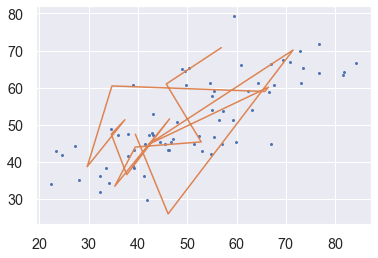

In [60]:
plt.plot(y_train,y_pred_train,".",y_test,y_pred_test,"-");

In [62]:
# Get the intercept of the model

linreg.intercept_

33.47310510903533

In [63]:
# Get the coefficients of the model

var_coefs = linreg.coef_
list(zip(x_train.columns,var_coefs))

[('chocolate', 23.346597354417764),
 ('fruity', 10.522018792058878),
 ('caramel', 2.773481638229904),
 ('peanutyalmondy', 11.222649763606107),
 ('nougat', 1.2188825774238803),
 ('crispedricewafer', 7.943317609823415),
 ('hard', -4.612030702015669),
 ('bar', 3.2641485380182997),
 ('pluribus', 2.2781838076950645),
 ('sugarpercent', 11.67858421656478),
 ('pricepercent', -15.091425206722052)]

#### Obervations: 
- Coefficients of features help to visualize their positive/negative effects
- If the coefficients are negative, it means increasing the values of corresponding features will decrease the win rate percentage
- Top two characterstics of candies are Chocolate and Fruity
- Hard candies have the negative impact on win percenatge
- Sugarpercent has a positive impact and Pricepercent” has a negative impact

**Model Evaluation Metrics:**

- __MAE__(Mean Absolute Error) - It's the __average error.__ 


- __MSE__ (Mean Squared Error) - Used more than MAE, because MSE "punishes" larger errors


- __RMSE__ ( Root Mean Squared Error) is even more popular than MSE, because RMSE is _interpretable_ in the "y" units.
    - Easier to put in context as it's the same units as our response variable.

<a id=section903></a>
### 9.3. Linear Regression - Model Evaluation 

In [64]:
from sklearn import metrics

In [65]:
# Calculate Mean Absolute Error on training and test set

MAE_train = metrics.mean_absolute_error(y_train, y_pred_train)
print('MAE of the model is {} on train set'.format(MAE_train))

MAE_test = metrics.mean_absolute_error(y_test, y_pred_test)
print('MAE of the model is {} on test set'.format(MAE_test))

MAE of the model is 7.939535158915255 on train set
MAE of the model is 9.177554141750612 on test set


In [66]:
# Calculate Mean Squared Error on training and test set

MSE_train = metrics.mean_squared_error(y_train, y_pred_train)
print('MSE of the model is {} on train set'.format(MSE_train))

MSE_test = metrics.mean_squared_error(y_test, y_pred_test)
print('MSE of the model is {} on test set'.format(MSE_test))

MSE of the model is 99.1340231450712 on train set
MSE of the model is 129.4527656109478 on test set


In [67]:
# Calculate the Root Mean Squared Error on training and test set

RMSE_train = np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))
print('RMSE of the model is {} on train set'.format(RMSE_train))

RMSE_test = np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))
print('RMSE of the model is {} on test set'.format(RMSE_test))

RMSE of the model is 9.956607009673084 on train set
RMSE of the model is 11.377731127555608 on test set


In [68]:
# Calculating R Squared value on train and test set

R_squared_train = metrics.r2_score(y_train, y_pred_train)
print('R squared value of the model is {} on train set'.format(R_squared_train))

R_squared_test = metrics.r2_score(y_test, y_pred_test)
print('R squared value of the model is {} on test set'.format(R_squared_test))

R squared value of the model is 0.55907176208959 on train set
R squared value of the model is 0.12104748112119146 on test set


<a id=section904></a>
### 9.4. Decision Tree

In [69]:
# Create Decision Tree model and fit the data

from sklearn.tree import DecisionTreeRegressor  
dt=DecisionTreeRegressor(max_depth=4)
dt.fit(x_train,y_train)

DecisionTreeRegressor(criterion='mse', max_depth=4, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')

In [70]:
# Make predictions on the train set

y_pred_train_dt = dt.predict(x_train)
y_pred_train_dt

array([35.334     , 46.68903846, 70.736     , 81.643     , 35.334     ,
       35.334     , 46.68903846, 76.42116667, 64.058     , 46.68903846,
       52.437     , 46.68903846, 64.058     , 55.68478571, 46.68903846,
       46.68903846, 46.297     , 64.058     , 55.68478571, 46.68903846,
       76.42116667, 22.445     , 23.418     , 55.68478571, 76.42116667,
       35.334     , 55.68478571, 55.68478571, 55.68478571, 46.68903846,
       46.68903846, 46.68903846, 55.68478571, 35.334     , 46.68903846,
       46.68903846, 46.68903846, 55.68478571, 55.68478571, 46.68903846,
       55.68478571, 31.833     , 59.529     , 46.68903846, 31.833     ,
       55.68478571, 46.68903846, 46.68903846, 55.68478571, 46.68903846,
       46.68903846, 76.42116667, 46.68903846, 55.68478571, 37.887     ,
       76.42116667, 46.68903846, 46.68903846, 64.058     , 52.437     ,
       64.058     , 46.68903846, 35.334     , 46.68903846, 55.68478571,
       76.42116667, 46.68903846, 46.68903846])

In [71]:
# Make predictions on the test set

y_pred_test_dt = dt.predict(x_test)
y_pred_test_dt

array([46.68903846, 35.334     , 76.42116667, 46.68903846, 55.68478571,
       64.058     , 55.68478571, 35.334     , 46.68903846, 46.68903846,
       35.334     , 46.68903846, 22.445     , 46.68903846, 46.68903846,
       55.68478571, 70.736     ])

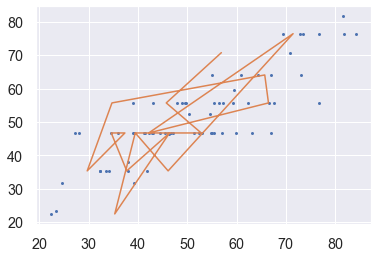

In [94]:
plt.plot(y_train,y_pred_train_dt,".",y_test,y_pred_test_dt,"-");

<a id=section905></a>
### 9.5. Decision Tree - Model Evaluation 

In [73]:
# Calculate the Mean Absolute Error on train and test set

MAE_train = metrics.mean_absolute_error(y_train, y_pred_train_dt)
print('MAE of the model is {} on train set'.format(MAE_train))

MAE_test = metrics.mean_absolute_error(y_test, y_pred_test_dt)
print('MAE of the model is {} on test set'.format(MAE_test))

MAE of the model is 5.985662895927601 on train set
MAE of the model is 8.271949687567334 on test set


In [74]:
# Calculate the Mean Squared Error on train and test set

MSE_train = metrics.mean_squared_error(y_train, y_pred_train_dt)
print('MSE of the model is {} on train set'.format(MSE_train))

MSE_test = metrics.mean_squared_error(y_test, y_pred_test_dt)
print('MSE of the model is {} on test set'.format(MSE_test))

MSE of the model is 64.64294350223551 on train set
MSE of the model is 93.43674067097984 on test set


In [75]:
# Calculate the Root Mean Squared Error on train and test set

RMSE_train = np.sqrt( metrics.mean_squared_error(y_train, y_pred_train_dt))
print('RMSE of the model is {} on train set'.format(RMSE_train))

RMSE_test = np.sqrt( metrics.mean_squared_error(y_test, y_pred_test_dt))
print('RMSE of the model is {} on test set'.format(RMSE_test))

RMSE of the model is 8.040083550699924 on train set
RMSE of the model is 9.66626818741234 on test set


In [91]:
# Calculate R Squared value on train and test set

R_squared_train = metrics.r2_score(y_train, y_pred_train_dt)
print('R squared value of the model is {} on train set'.format(R_squared_train))

R_squared_test = metrics.r2_score(y_test, y_pred_test_dt)
#print('R squared value of the model is {} on test set'.format(R_squared_test)

R squared value of the model is 0.7124811616888362 on train set


<a id=section906></a>
### 9.6. Random Forest

In [77]:
# Create Random Forest model and fit the data

from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
rf.fit(x_train,y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

In [78]:
# Make predictions on the train set

y_pred_train_rf = rf.predict(x_train)
y_pred_train_rf

array([34.159     , 59.6433    , 71.4421    , 73.7891    , 34.7179    ,
       35.4728    , 54.1035    , 76.7735    , 54.4261    , 48.12066667,
       52.6567    , 49.13116667, 67.0998    , 50.8026    , 31.5837    ,
       54.17086667, 34.7178    , 62.8664    , 52.6213    , 48.94923333,
       71.7386    , 29.4942    , 25.6769    , 52.4743    , 68.7629    ,
       40.6475    , 54.4807    , 58.511425  , 54.318     , 47.3828    ,
       49.0299    , 60.53108   , 63.94635   , 35.5644    , 47.6314    ,
       45.46456667, 54.17086667, 52.9202    , 47.2291    , 49.3458    ,
       54.318     , 33.0262    , 62.6996    , 60.53108   , 43.2727    ,
       53.8226    , 43.1824    , 50.7239    , 58.511425  , 38.64468   ,
       37.5205    , 67.3707    , 44.276     , 61.4056    , 54.71235   ,
       76.2756    , 38.64468   , 42.0748    , 70.36613333, 54.3962    ,
       66.15123333, 48.474     , 37.9028    , 45.46456667, 60.6553    ,
       72.9696    , 47.9778    , 41.6306    ])

In [79]:
# Making predictions on the test set

y_pred_test_rf = rf.predict(x_test)
y_pred_test_rf

array([45.77976667, 30.0384    , 72.2808    , 54.17086667, 61.0414    ,
       62.0001    , 54.1603    , 40.9466    , 53.23415667, 44.9416    ,
       38.4566    , 54.44964   , 38.1253    , 41.59386667, 50.7239    ,
       54.1914    , 71.6785    ])

In [80]:
residual_rf = y_pred_test_rf - y_test
residual_rf

14     6.318767
3    -16.078600
32     0.815800
21    11.991867
43    -5.429600
56    -3.715900
59    19.438300
57    11.242600
50    15.885157
69    10.362600
48     0.734600
34     8.037640
55     2.834300
45     2.146867
67    -2.102100
76     8.454400
6     14.763500
Name: winpercent, dtype: float64

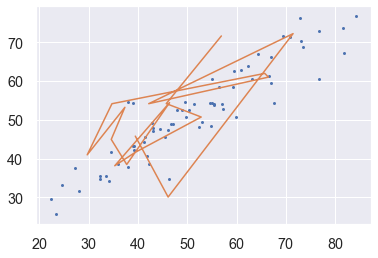

In [81]:
plt.plot(y_train,y_pred_train_rf,".",y_test,y_pred_test_rf,"-");

<a id=section907></a>
### 9.7.Random Forest - Model Evaluation 

In [82]:
# Calculate the Mean Absolute Error on train and test set

MAE_train = metrics.mean_absolute_error(y_train, y_pred_train_rf)
print('MAE of the model is {} on train set'.format(MAE_train))

MAE_test = metrics.mean_absolute_error(y_test, y_pred_test_rf)
print('MAE of the model is {} on test set'.format(MAE_train))

MAE of the model is 4.470815686274509 on train set
MAE of the model is 4.470815686274509 on test set


In [83]:
# Calculate the Mean Squared Error on train and test set 

MSE_train = metrics.mean_squared_error(y_train, y_pred_train_rf)
print('MSE of the model is {} on train set'.format(MSE_train))

MSE_test = metrics.mean_squared_error(y_test, y_pred_test_rf)
print('MSE of the model is {} on test set'.format(MSE_test))

MSE of the model is 35.145157063684074 on train set
MSE of the model is 101.28320709220459 on test set


In [84]:
# Calculate the Root Mean Squared Error on train and test set

RMSE_train = np.sqrt( metrics.mean_squared_error(y_train, y_pred_train_rf))
print('RMSE of the model is {} on train set'.format(RMSE_train))

RMSE_test = np.sqrt( metrics.mean_squared_error(y_test, y_pred_test_rf))
print('RMSE of the model is {} on test set'.format(RMSE_test))

RMSE of the model is 5.928335100488507 on train set
RMSE of the model is 10.06395583715492 on test set


In [85]:
# Calculate R Squared value on train and test set

R_squared_train = metrics.r2_score(y_train, y_pred_train_rf)
print('R squared value of the model is {} on train set'.format(R_squared_train))

R_squared_test = metrics.r2_score(y_test, y_pred_test_rf)
print('R squared value of the model is {} on test set'.format(R_squared_test))

R squared value of the model is 0.8436813953117035 on train set
R squared value of the model is 0.312311872414037 on test set


<a id=section10></a>
## 10. Conclusion

- Chocolate and Peanuts / Almonds flavors are the most popular candies
- Bar candies have high Win percentage and are slightly expensive
- **Random Forest** is the best recommended fit model for predicting the Win percentage based on high R2 value and low value of RMSE out of other models – Linear Regression and Decision Tree which are on higher side of RMSE values